In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

timestamp = '20231122_133530'
#timestamp = '20231122_161757'
#timestamp = '20231116_151751'
timestamp = '20231129_133727'
#timestamp = '20231129_114803'
#timestamp = '20231129_145109'


# Directory path
#directory_path = f'/home/insectvr/src/build/20231116_StripeFixation_Data/RunData/{timestamp}/'
#directory_path = f'/Users/apaula/Nextcloud/locustVR/locustVR_data/20231122_RunData/{timestamp}/'
directory_path = f'/Users/apaula/Nextcloud/locustVR/locustVR_data/RunData_20231129/{timestamp}/'

# Full paths for each file
file_path1 = directory_path + f'{timestamp}_ChoiceAssay_VR1_.csv'
file_path2 = directory_path + f'{timestamp}_ChoiceAssay_VR2_.csv'
file_path3 = directory_path + f'{timestamp}_ChoiceAssay_VR3_.csv'
file_path4 = directory_path + f'{timestamp}_ChoiceAssay_VR4_.csv'

# Load the files into DataFrames
df1 = pd.read_csv(file_path1)
df2 = pd.read_csv(file_path2)
df3 = pd.read_csv(file_path3)
df4 = pd.read_csv(file_path4)

# Parse dates in the "Current Time" column
df1['Current Time'] = pd.to_datetime(df1['Current Time'])
df2['Current Time'] = pd.to_datetime(df2['Current Time'])
df3['Current Time'] = pd.to_datetime(df3['Current Time'])
df4['Current Time'] = pd.to_datetime(df4['Current Time'])

# Display the first few rows of each DataFrame to confirm
print("DataFrame 1:")
print(df1.head())
print("\nDataFrame 2:")
print(df2.head())
print("\nDataFrame 3:")
print(df3.head())
print("\nDataFrame 4:")
print(df4.head())

DataFrame 1:
             Current Time   VR        Scene  CurrentStep  GameObjectPosX  \
0 2023-11-29 13:43:40.586  VR1  ChoiceAssay            1               0   
1 2023-11-29 13:43:40.604  VR1  ChoiceAssay            1               0   
2 2023-11-29 13:43:40.620  VR1  ChoiceAssay            1               0   
3 2023-11-29 13:43:40.637  VR1  ChoiceAssay            1               0   
4 2023-11-29 13:43:40.654  VR1  ChoiceAssay            1               0   

   GameObjectPosY  GameObjectPosZ  GameObjectRotX  GameObjectRotY  \
0               0               0               0          0.0000   
1               0               0               0          0.0000   
2               0               0               0        270.3852   
3               0               0               0        271.2838   
4               0               0               0          0.0000   

   GameObjectRotZ  SensPosX  SensPosY  SensPosZ  SensRotX  SensRotY  SensRotZ  
0               0  0.000000  0.0000

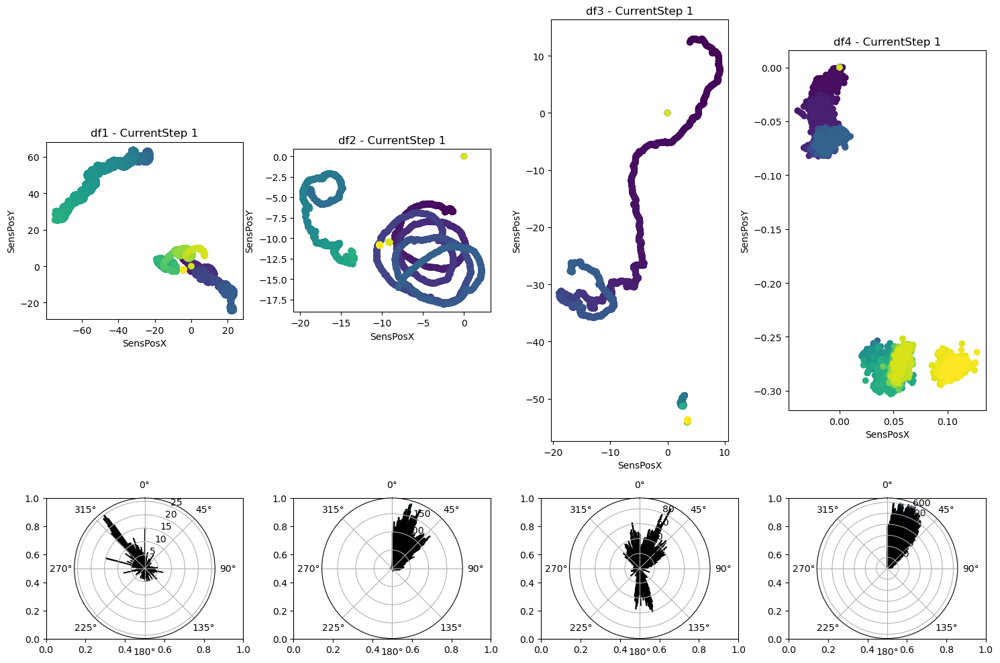

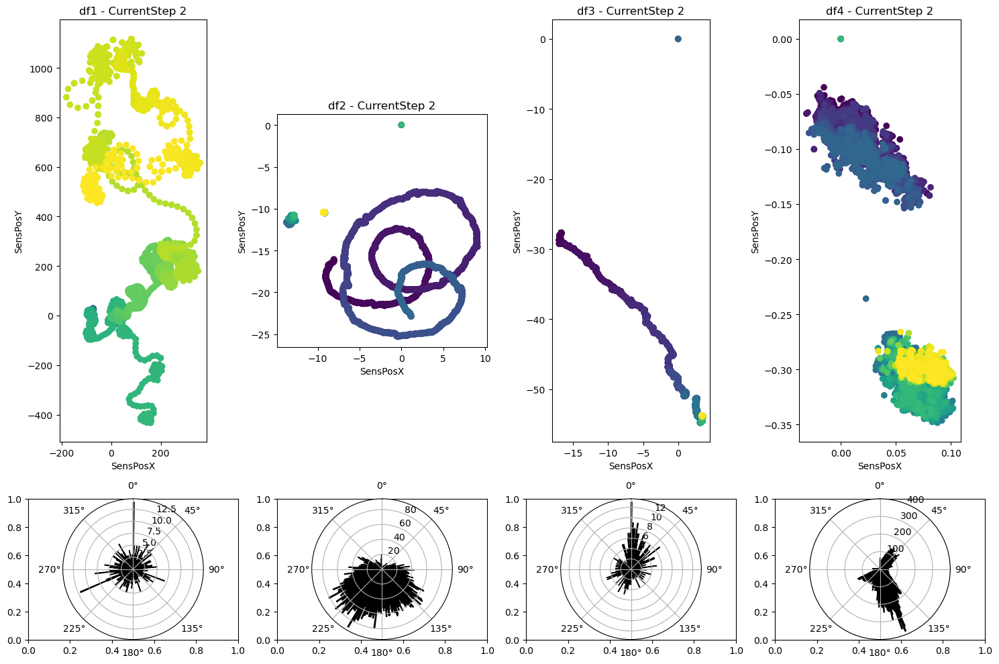

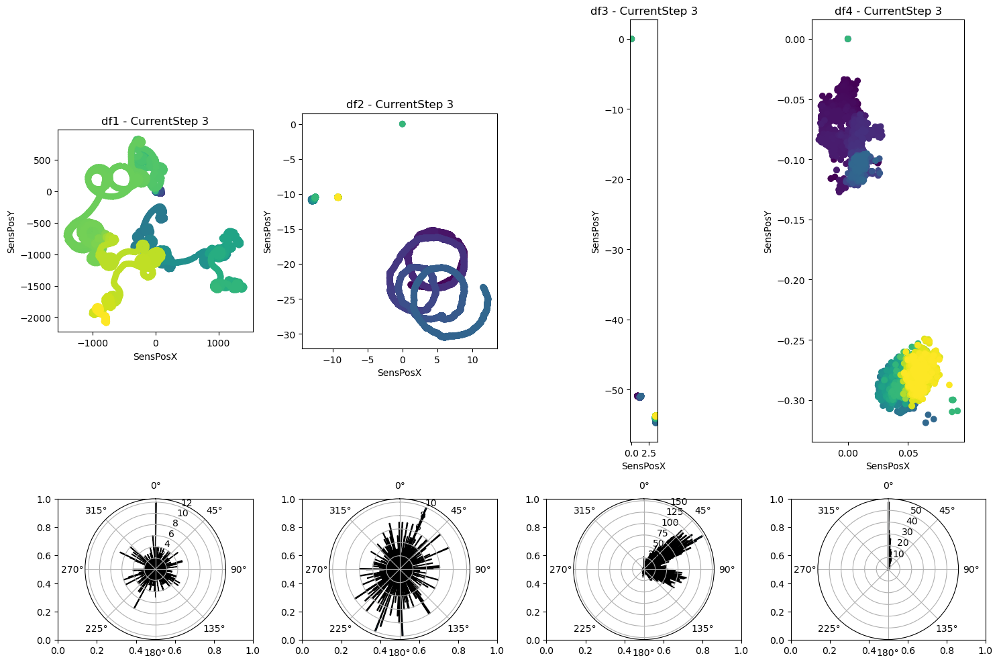

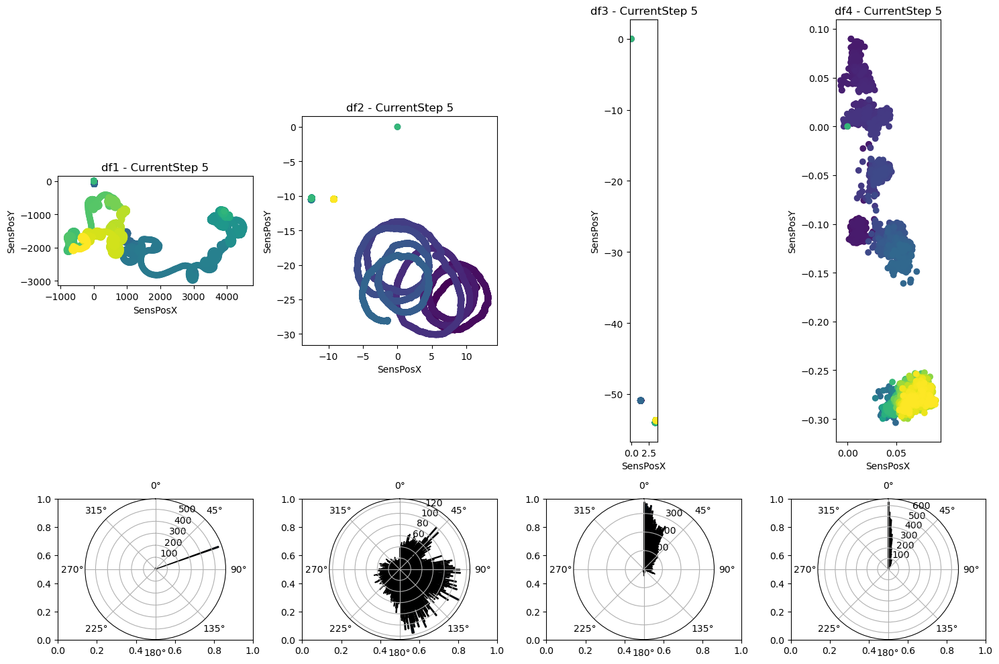

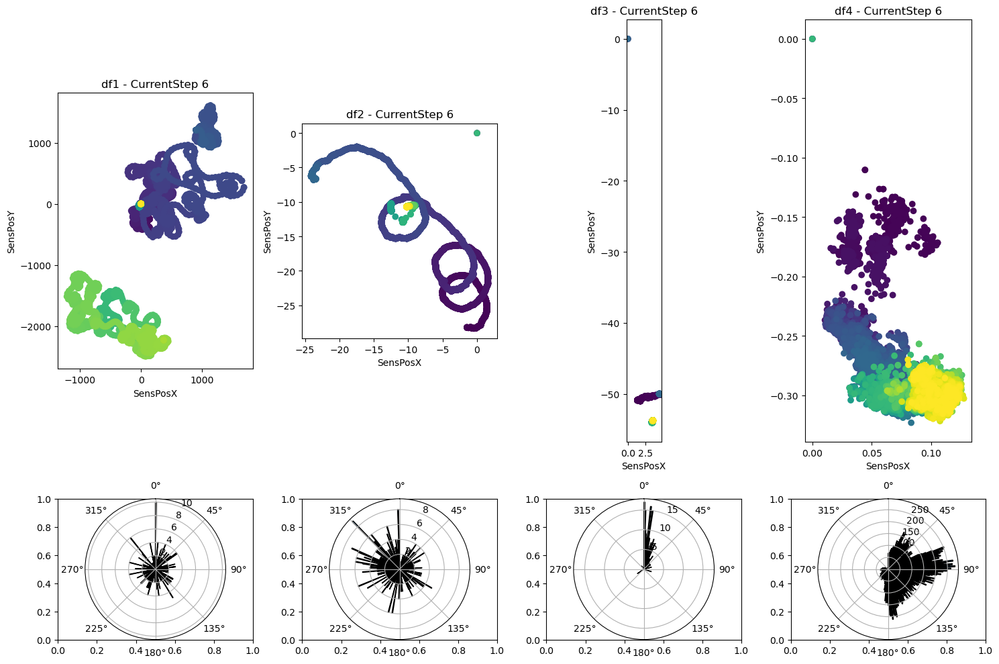

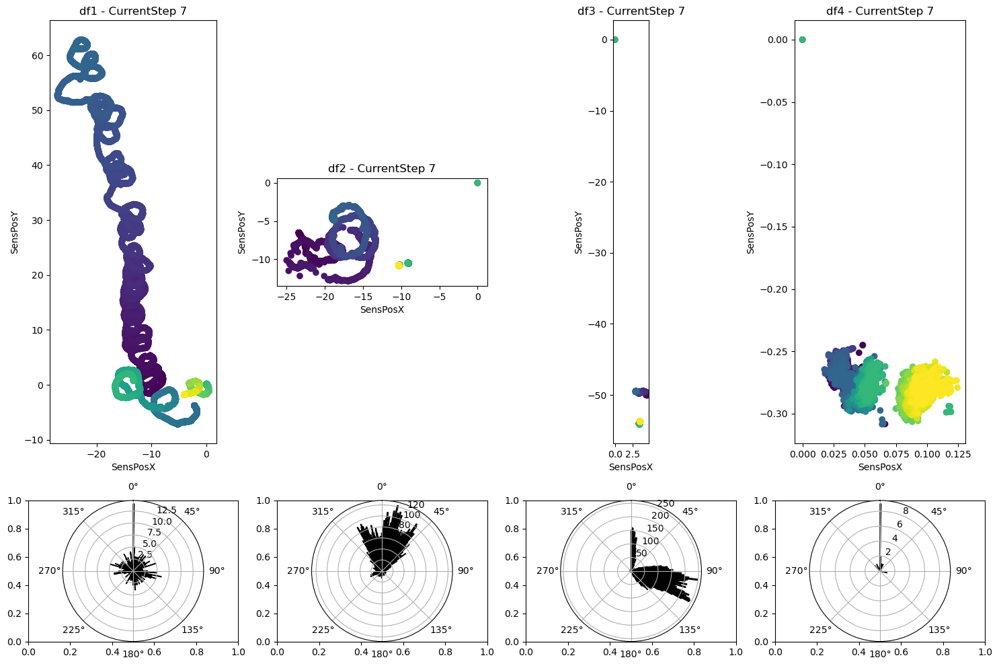

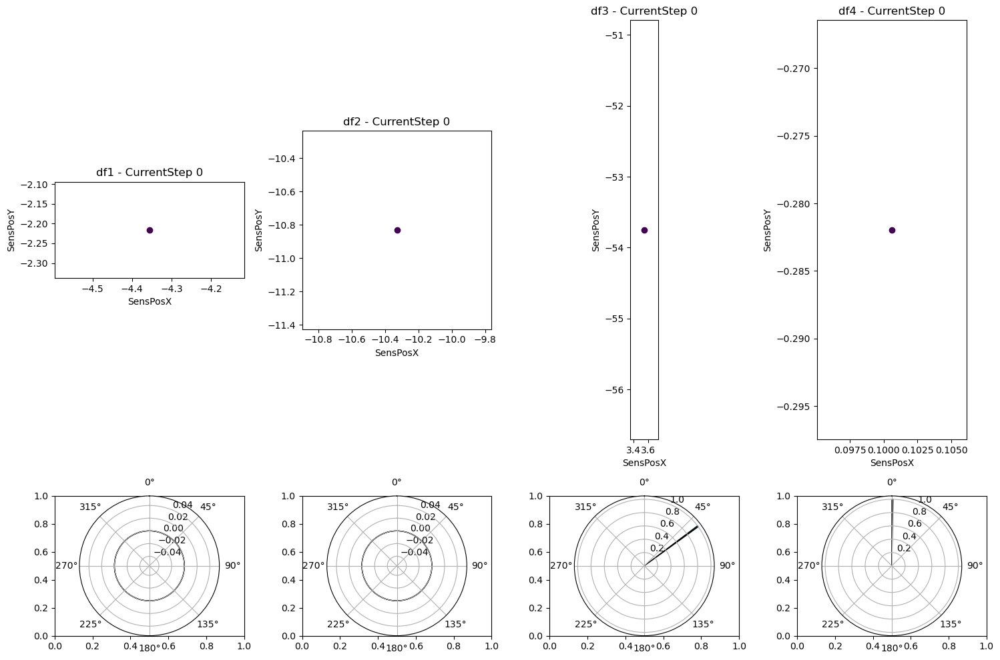

In [45]:
def plot_trajectories_and_polar_histograms(df1, df2, df3, df4):
    df1['source'] = 'df1'
    df2['source'] = 'df2'
    df3['source'] = 'df3'
    df4['source'] = 'df4'

    # Combine all DataFrames into one
    df_combined = pd.concat([df1, df2, df3, df4])

    # Get the unique steps
    steps = df_combined['CurrentStep'].unique()

    # Number of bins for the polar histogram
    num_bins = 360

    for step in steps:
        # Filter the DataFrame for the given step value
        filtered_df = df_combined[df_combined['CurrentStep'] == step]
        sources = filtered_df['source'].unique()

        # Creating a figure for trajectories and polar histograms
        fig, axes = plt.subplots(2, len(sources), figsize=(15, 10), 
                                 gridspec_kw={'height_ratios': [3, 1]})

        # Adjust the axes array for single source
        if len(sources) == 1:
            axes = [axes]

        for i, source in enumerate(sources):
            # Filter by source
            source_df = filtered_df[filtered_df['source'] == source]

            # Plot trajectory
            ax_traj = axes[0][i] if len(sources) > 1 else axes[0]
            sc = ax_traj.scatter(source_df['SensPosX'], source_df['SensPosY'], c=np.arange(len(source_df)), cmap='viridis')
            ax_traj.set_title(f'{source} - CurrentStep {step}')
            ax_traj.set_xlabel('SensPosX')
            ax_traj.set_ylabel('SensPosY')
            ax_traj.set_aspect('equal', adjustable='box')  # Equal scaling for x and y axes

            # Plot polar histogram
            ax_polar = axes[1][i] if len(sources) > 1 else axes[1]
            ax_polar = fig.add_subplot(2, len(sources), len(sources) + i + 1, polar=True)
            rot_x_values = source_df['GameObjectRotY']
            counts, bin_edges = np.histogram(rot_x_values, bins=num_bins, range=(0, 2*np.pi))
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            ax_polar.bar(bin_centers, counts, width=bin_edges[1] - bin_edges[0], edgecolor='k')
            ax_polar.set_theta_zero_location('N')
            ax_polar.set_theta_direction(-1)

        plt.tight_layout()
        plt.show()

# Since we don't have the actual data, the function call is commented out.
# To use this function with your data, simply uncomment and call the function like this:
plot_trajectories_and_polar_histograms(df1, df2, df3, df4)


In [46]:
def discretize_space(df, space_disc_threshold):
    """
    Discretizes the space in the dataframe and filters to keep only the rows where space is discretized.

    Args:
    df (pd.DataFrame): The dataframe containing the trajectory data.
    space_disc_threshold (float): The threshold distance for discretization.

    Returns:
    pd.DataFrame: A filtered dataframe containing only the rows where 'space_disc' is True.
    """
    # Initialize the 'space_disc' column to False
    df['space_disc'] = False

    # Set the first point as a reference point and mark it as True
    ref_pos = df.iloc[0]
    df.loc[0, 'space_disc'] = True

    for i, row in df.iterrows():
        if i == 0:
            continue

        # Calculate the distance from the reference point
        xdist = ref_pos['SensPosX'] - row['SensPosX']
        ydist = ref_pos['SensPosY'] - row['SensPosY']
        xydist = np.sqrt(xdist**2 + ydist**2)

        # If the distance is greater than or equal to the threshold, update the reference point and mark as True
        if xydist >= space_disc_threshold:
            ref_pos = row
            df.loc[i, 'space_disc'] = True

    # Filter the dataframe to keep only rows where 'space_disc' is True
    filtered_df = df[df['space_disc']]

    return filtered_df

# Example usage (uncomment and replace 'your_dataframe' with your actual dataframe and 'your_threshold' with the desired threshold):
# filtered_discretized_df = discretize_and_filter_space(your_dataframe, your_threshold)
# Note: This function returns a new dataframe containing only the rows where 'space_disc' is True.


In [47]:
# Specify the space discretization threshold
space_disc_threshold = 1.0  # Example threshold, adjust as needed

# Discretize each dataframe
df1_discretized = discretize_space(df1, space_disc_threshold)
df2_discretized = discretize_space(df2, space_disc_threshold)
df3_discretized = discretize_space(df3, space_disc_threshold)
df4_discretized = discretize_space(df4, space_disc_threshold)

In [48]:
def calculate_direction_of_movement(df):
    """
    Calculate the direction of movement from one frame to the next in the dataframe in degrees.

    Args:
    df (pd.DataFrame): The dataframe containing the trajectory data with 'SensPosX' and 'SensPosY' columns.

    Returns:
    pd.DataFrame: The dataframe with an additional column 'movement_direction_deg' indicating the direction of movement in degrees.
    """
    # Creating a copy of the dataframe to avoid SettingWithCopyWarning
    df_copy = df.copy()

    # Calculate differences in position
    df_copy.loc[:, 'delta_x'] = df_copy['SensPosX'].diff()
    df_copy.loc[:, 'delta_y'] = df_copy['SensPosY'].diff()

    # Calculate the direction of movement in radians and then convert to degrees
    df_copy.loc[:, 'movement_direction'] = np.arctan2(df_copy['delta_y'], df_copy['delta_x']) * (180 / np.pi)

    return df_copy

# Example usage (apply to your dataframes):
# df1 = calculate_direction_of_movement_deg(df1)
# df2 = calculate_direction_of_movement_deg(df2)
# df3 = calculate_direction_of_movement_deg(df3)
# df4 = calculate_direction_of_movement_deg(df4)


In [49]:
df1 = calculate_direction_of_movement(df1)
df2 = calculate_direction_of_movement(df2)
df3 = calculate_direction_of_movement(df3)
df4 = calculate_direction_of_movement(df4)
df1_discretized = calculate_direction_of_movement(df1_discretized)
df2_discretized = calculate_direction_of_movement(df2_discretized)
df3_discretized = calculate_direction_of_movement(df3_discretized)
df4_discretized = calculate_direction_of_movement(df4_discretized)

In [50]:
df1_discretized


,Current Time,VR,Scene,CurrentStep,GameObjectPosX,GameObjectPosY,GameObjectPosZ,GameObjectRotX,GameObjectRotY,GameObjectRotZ,...,SensPosY,SensPosZ,SensRotX,SensRotY,SensRotZ,source,space_disc,delta_x,delta_y,movement_direction
0,2023-11-29 13:43:40.586,VR1,ChoiceAssay,1,0,0,0,0,0.0000,0,...,0.000000,0,0,0.00000,0,df1,True,NaN,NaN,NaN
1,2023-11-29 13:43:40.604,VR1,ChoiceAssay,1,0,0,0,0,0.0000,0,...,2.293621,0,0,270.38520,0,df1,True,-2.048960,2.293621,131.775365
757,2023-11-29 13:43:53.205,VR1,ChoiceAssay,1,0,0,0,0,139.3085,0,...,3.194283,0,0,49.27493,0,df1,True,-0.459089,0.900662,117.009029
1166,2023-11-29 13:44:00.022,VR1,ChoiceAssay,1,0,0,0,0,165.7808,0,...,4.076387,0,0,72.21215,0,df1,True,-0.534843,0.882104,121.229542
1444,2023-11-29 13:44:04.655,VR1,ChoiceAssay,1,0,0,0,0,224.4650,0,...,3.918354,0,0,131.05780,0,df1,True,-0.987743,-0.158033,-170.910056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191233,2023-11-29 14:36:48.674,VR1,ChoiceAssay,7,0,0,0,0,210.3910,0,...,-0.613341,0,0,223.12640,0,df1,True,-0.034885,-1.001762,-91.994442
192966,2023-11-29 14:37:17.559,VR1,ChoiceAssay,7,0,0,0,0,188.9511,0,...,-1.315390,0,0,202.35270,0,df1,True,-0.750444,-0.702049,-136.908292
193043,2023-11-29 14:37:18.843,VR1,ChoiceAssay,7,0,0,0,0,155.4247,0,...,-1.544410,0,0,170.93950,0,df1,True,-0.995481,-0.229020,-167.043990
194364,2023-11-29 14:37:40.913,VR1,ChoiceAssay,1,0,0,0,0,0.0000,0,...,0.000000,0,0,0.00000,0,df1,True,3.098170,1.544410,26.495844


Step 1, Source df1, Direction Range: Min = -3.134093562333997, Max = 3.130459162052413
Step 1, Source df2, Direction Range: Min = -3.1393267739221233, Max = 3.099609641445049
Step 1, Source df3, Direction Range: Min = -3.056321625713087, Max = 3.1410815609574687
Step 1, Source df4, Direction Range: Min = nan, Max = nan


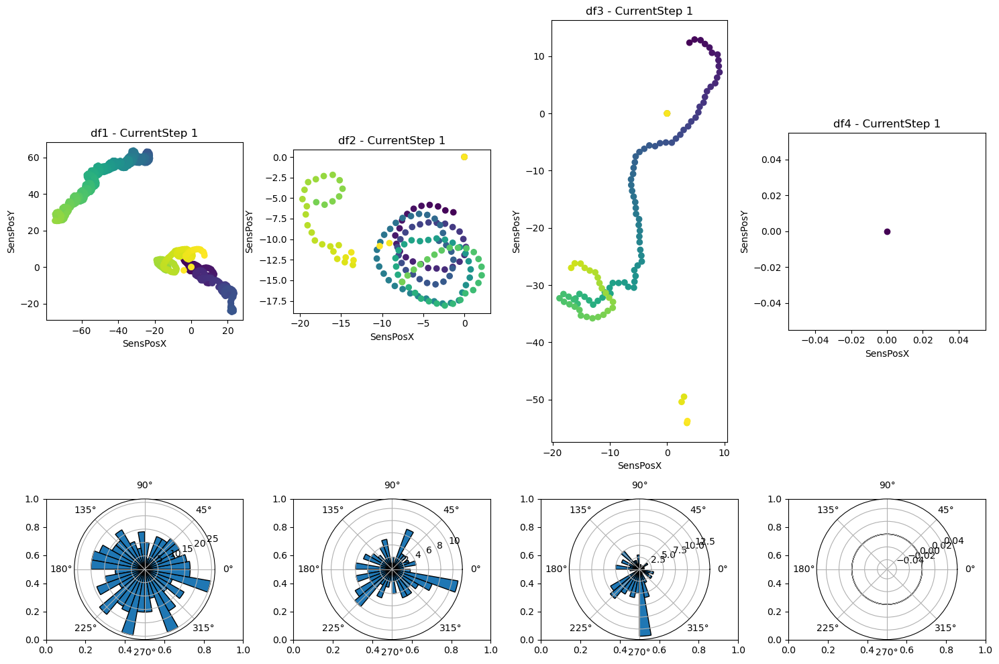

Step 2, Source df1, Direction Range: Min = -3.139859448857974, Max = 3.140207459440287
Step 2, Source df2, Direction Range: Min = -3.140307647714498, Max = 3.0371537393414987
Step 2, Source df3, Direction Range: Min = -2.1134821494371425, Max = 1.6209928119605506


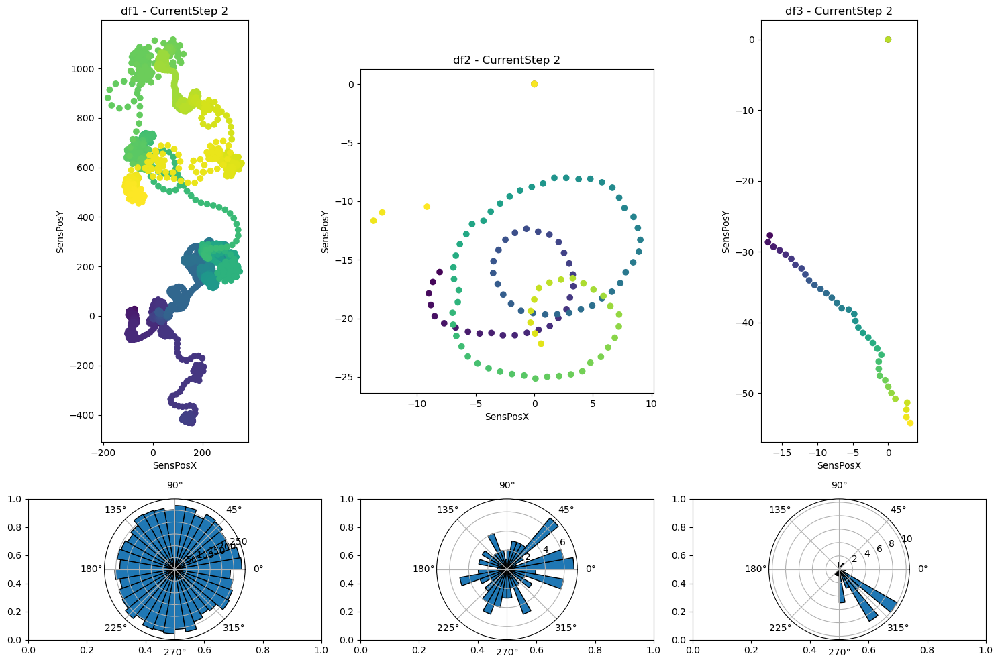

Step 3, Source df1, Direction Range: Min = -3.140983485418168, Max = 3.141592653589793
Step 3, Source df2, Direction Range: Min = -3.1374189932024867, Max = 3.0582768297200187
Step 3, Source df3, Direction Range: Min = -1.5536742717000223, Max = 1.6347646472805348


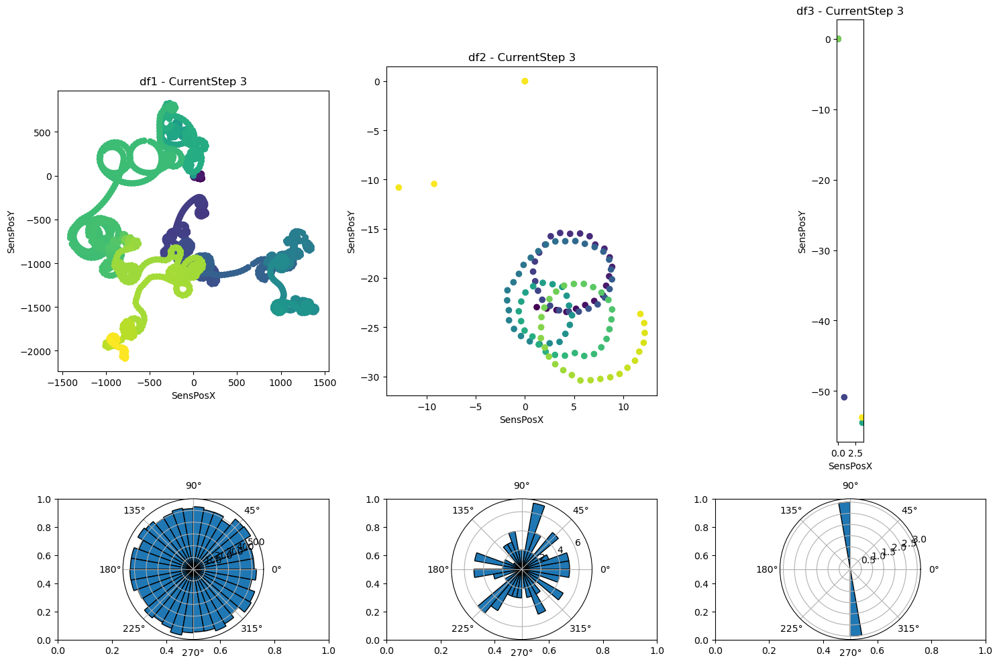

Step 5, Source df1, Direction Range: Min = -3.141071667861595, Max = 3.141592653589793
Step 5, Source df2, Direction Range: Min = -3.1308815870103937, Max = 3.130280237640232
Step 5, Source df3, Direction Range: Min = -1.544328711009571, Max = 1.6342286961616845


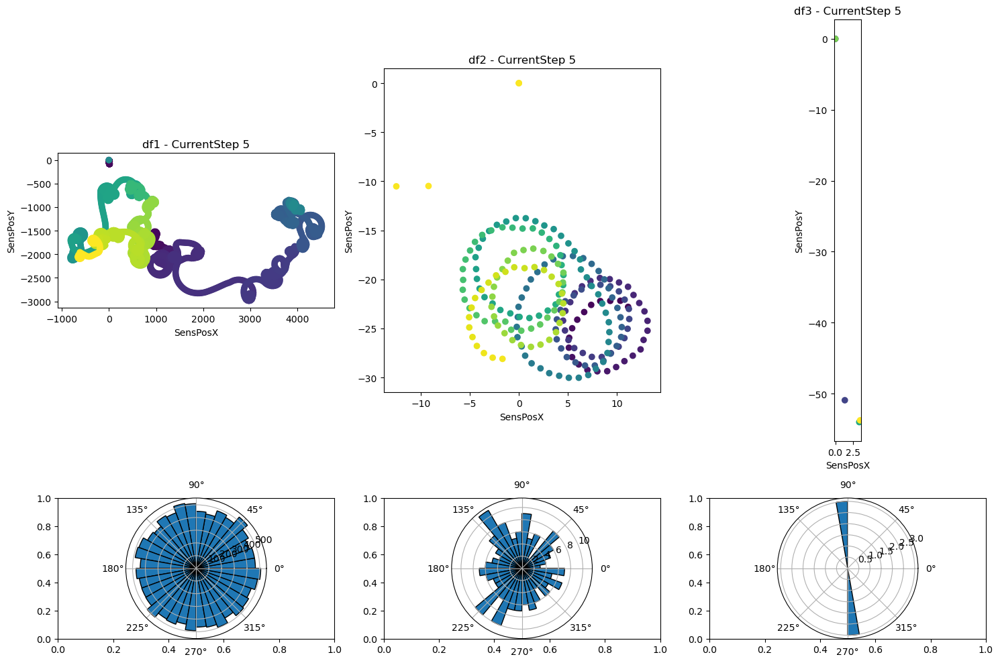

Step 6, Source df1, Direction Range: Min = -3.141560470107913, Max = 3.140802631532246
Step 6, Source df2, Direction Range: Min = -3.097711301139335, Max = 3.019236080178373
Step 6, Source df3, Direction Range: Min = -1.5448367725774177, Max = 1.6333657755084983


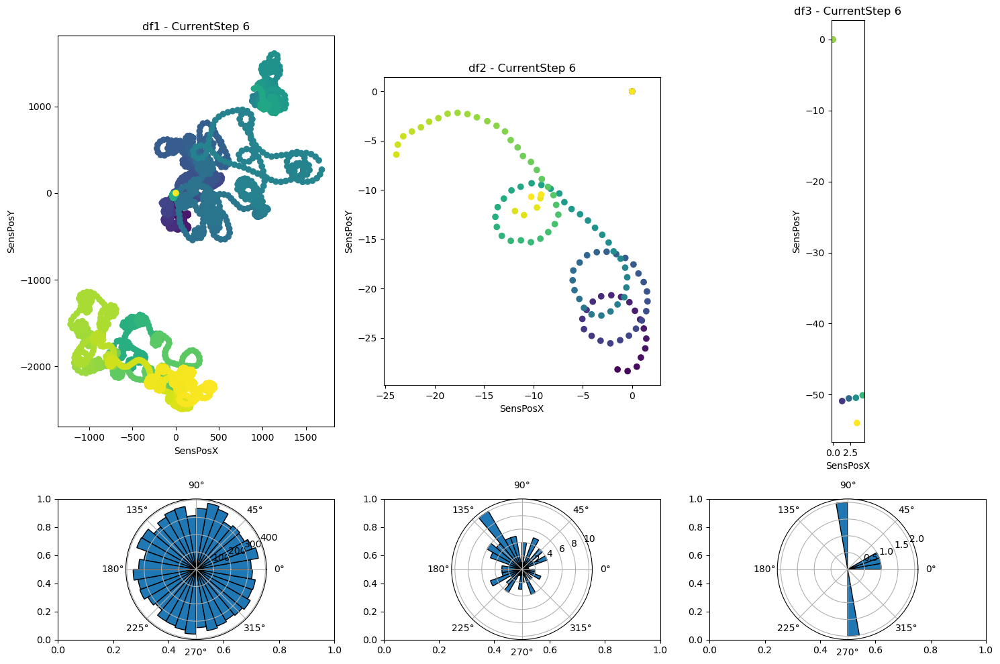

Step 7, Source df1, Direction Range: Min = -3.1125148176244575, Max = 3.1413849384592467
Step 7, Source df2, Direction Range: Min = -3.125899227283725, Max = 3.02406018574441
Step 7, Source df3, Direction Range: Min = -1.5080545609203762, Max = 2.865999504818561


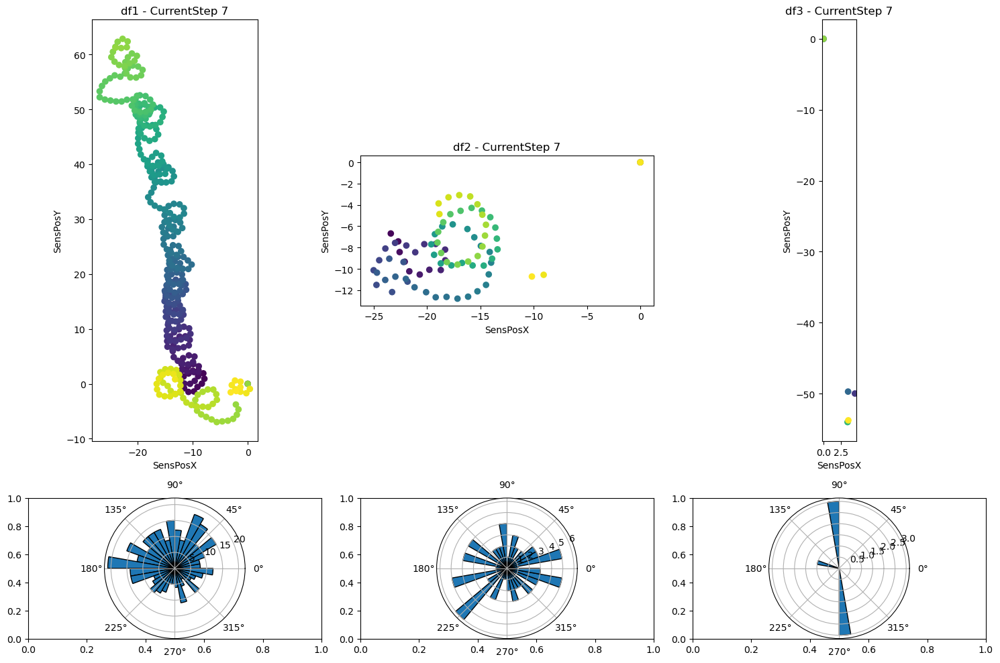

In [51]:
import matplotlib.pyplot as plt
import numpy as np

def plot_trajectories_and_polar_histograms_2(df1, df2, df3, df4):
    df1['source'] = 'df1'
    df2['source'] = 'df2'
    df3['source'] = 'df3'
    df4['source'] = 'df4'

    # Combine all DataFrames into one
    df_combined = pd.concat([df1, df2, df3, df4])

    # Get the unique steps
    steps = df_combined['CurrentStep'].unique()

    # Number of bins for the polar histogram
    num_bins = 36

    for step in steps:
        # Filter the DataFrame for the given step value
        filtered_df = df_combined[df_combined['CurrentStep'] == step]
        sources = filtered_df['source'].unique()

        # Creating a figure for trajectories and polar histograms
        fig, axes = plt.subplots(2, len(sources), figsize=(15, 10), 
                                 gridspec_kw={'height_ratios': [3, 1]})

        # Adjust the axes array for single source
        if len(sources) == 1:
            axes = [axes]

        for i, source in enumerate(sources):
            # Filter by source
            source_df = filtered_df[filtered_df['source'] == source]

            # Plot trajectory
            ax_traj = axes[0][i] if len(sources) > 1 else axes[0]
            sc = ax_traj.scatter(source_df['SensPosX'], source_df['SensPosY'], c=np.arange(len(source_df)), cmap='viridis')
            ax_traj.set_title(f'{source} - CurrentStep {step}')
            ax_traj.set_xlabel('SensPosX')
            ax_traj.set_ylabel('SensPosY')
            ax_traj.set_aspect('equal', adjustable='box')  # Equal scaling for x and y axes

            # Plot polar histogram
            ax_polar = axes[1][i] if len(sources) > 1 else axes[1]
            ax_polar = fig.add_subplot(2, len(sources), len(sources) + i + 1, polar=True)

            # Ensure you are using the correct column name here
            direction_values = source_df['movement_direction'] /180 * np.pi  # change to the correct column name

            # Remove NaNs or Infs before plotting, if present
            direction_values = direction_values[~np.isnan(direction_values)]
            direction_values = direction_values[np.isfinite(direction_values)]

             # Debugging: Check the range of values
            print(f"Step {step}, Source {source}, Direction Range: Min = {direction_values.min()}, Max = {direction_values.max()}")

            # Ensure the range matches the data format (degrees in this case)
            counts, bin_edges = np.histogram(direction_values, bins=num_bins, range=(-np.pi, np.pi))
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            ax_polar.bar(bin_centers, counts, width=bin_edges[1] - bin_edges[0], edgecolor='k')
            #ax_polar.set_theta_zero_location('N')
            #ax_polar.set_theta_direction(-1)

        plt.tight_layout()
        plt.show()

plot_trajectories_and_polar_histograms_2(df1_discretized, df2_discretized, df3_discretized, df4_discretized)


/var/folders/fp/69w3242x183607ffnzm682500000gp/T/ipykernel_1418/2695303059.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['source'] = 'df1'
/var/folders/fp/69w3242x183607ffnzm682500000gp/T/ipykernel_1418/2695303059.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['source'] = 'df2'
/var/folders/fp/69w3242x183607ffnzm682500000gp/T/ipykernel_1418/2695303059.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] =

Step 1, Source df1, Direction Range: Min = -3.14144759992101, Max = 3.141592653589793
Step 1, Source df2, Direction Range: Min = -3.14117176915965, Max = 3.141592653589793
Step 1, Source df3, Direction Range: Min = -3.1397572319737215, Max = 3.141592653589793
Step 1, Source df4, Direction Range: Min = -3.1414959059512637, Max = 3.141053256041331


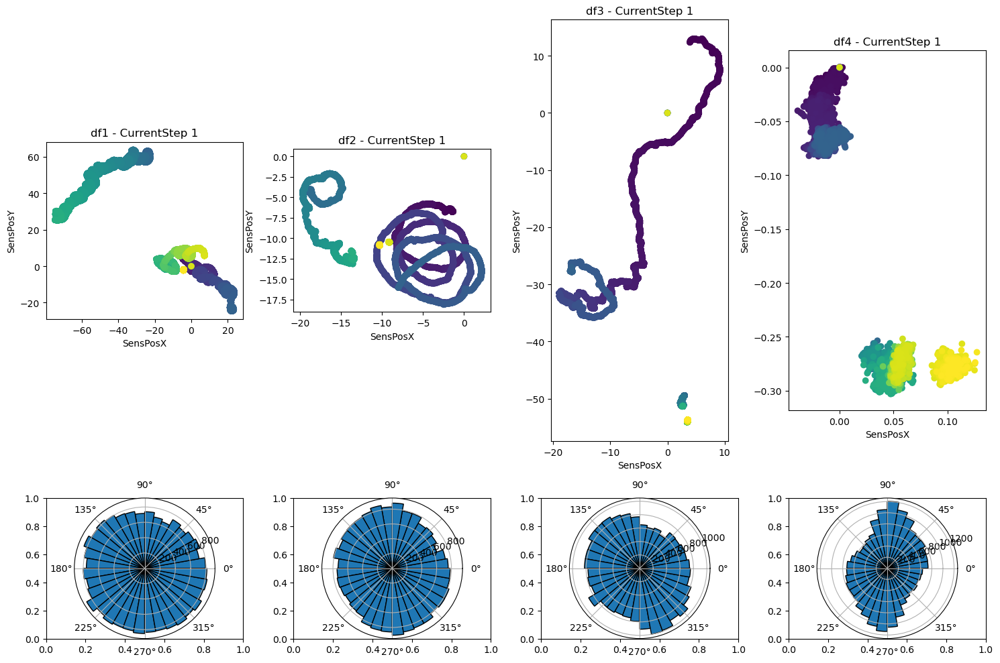

Step 2, Source df1, Direction Range: Min = -3.141456413808601, Max = 3.141592653589793
Step 2, Source df2, Direction Range: Min = -3.1394115130385862, Max = 3.141592653589793
Step 2, Source df3, Direction Range: Min = -3.1407500754995517, Max = 3.141592653589793
Step 2, Source df4, Direction Range: Min = -3.141579558052707, Max = 3.140801082705213


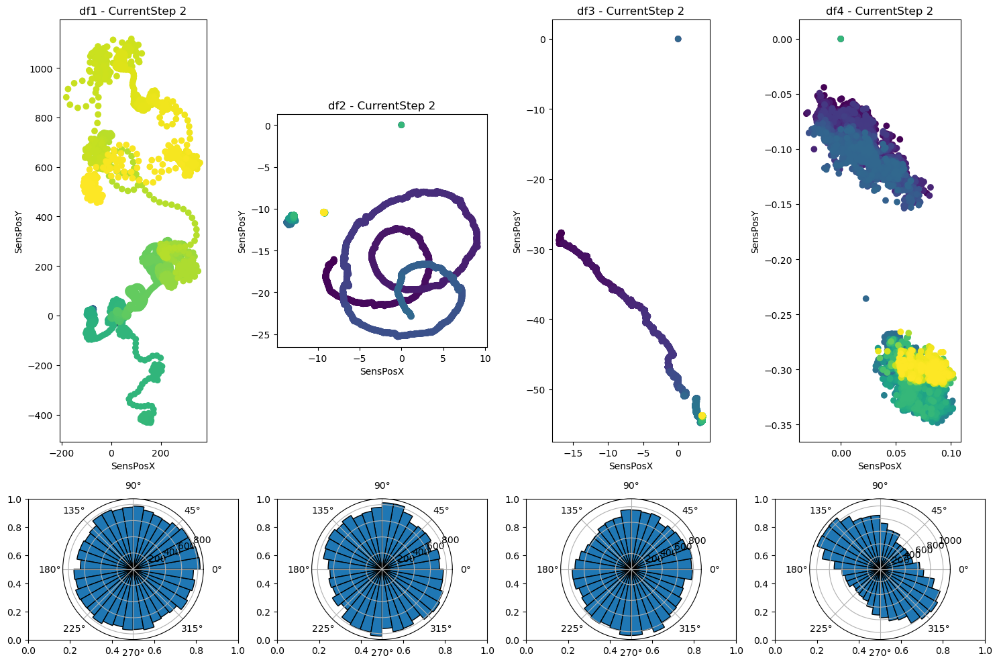

Step 3, Source df1, Direction Range: Min = -3.14143675679473, Max = 3.141592653589793
Step 3, Source df2, Direction Range: Min = -3.1407200534622612, Max = 3.141592653589793
Step 3, Source df3, Direction Range: Min = -3.1407553432273128, Max = 3.141592653589793
Step 3, Source df4, Direction Range: Min = -3.141372707153442, Max = 3.141562275442626


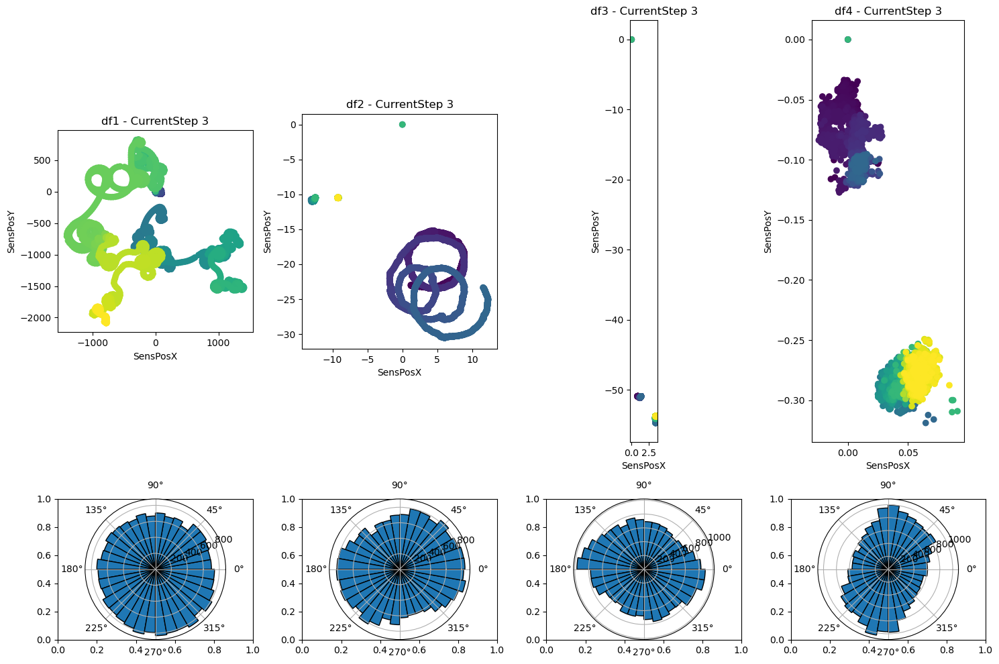

Step 5, Source df1, Direction Range: Min = -3.141071667861595, Max = 3.141592653589793
Step 5, Source df2, Direction Range: Min = -3.141324549893715, Max = 3.141592653589793
Step 5, Source df3, Direction Range: Min = -3.140869483337203, Max = 3.141592653589793
Step 5, Source df4, Direction Range: Min = -3.141165759272063, Max = 3.141592653589793


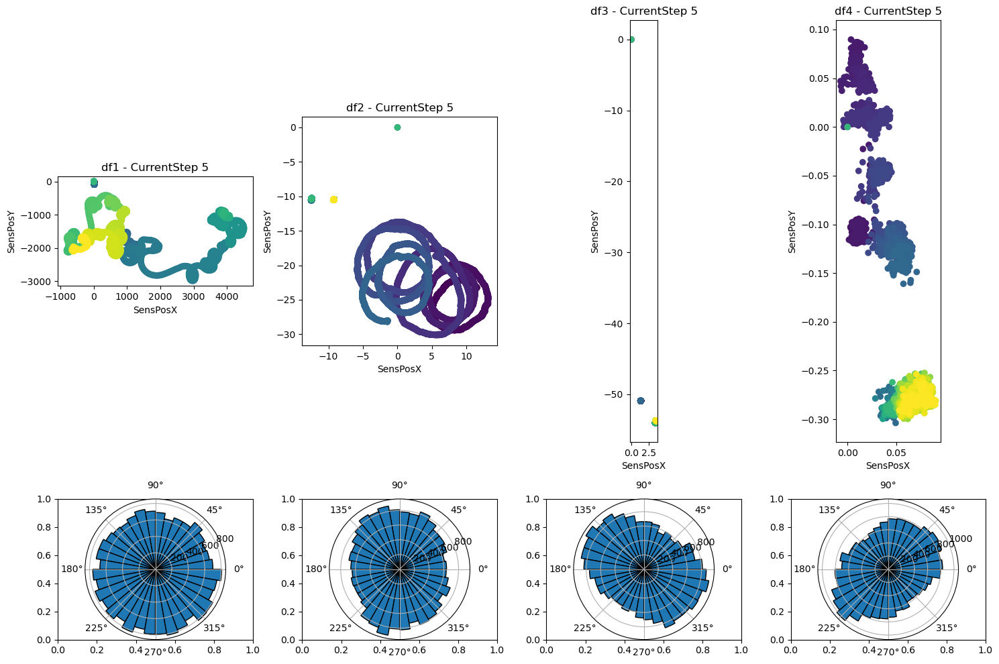

Step 6, Source df1, Direction Range: Min = -3.141560470107913, Max = 3.141592653589793
Step 6, Source df2, Direction Range: Min = -3.1413529517834458, Max = 3.141592653589793
Step 6, Source df3, Direction Range: Min = -3.1410909478320095, Max = 3.141592653589793
Step 6, Source df4, Direction Range: Min = -3.1413807143488772, Max = 3.140997181206112


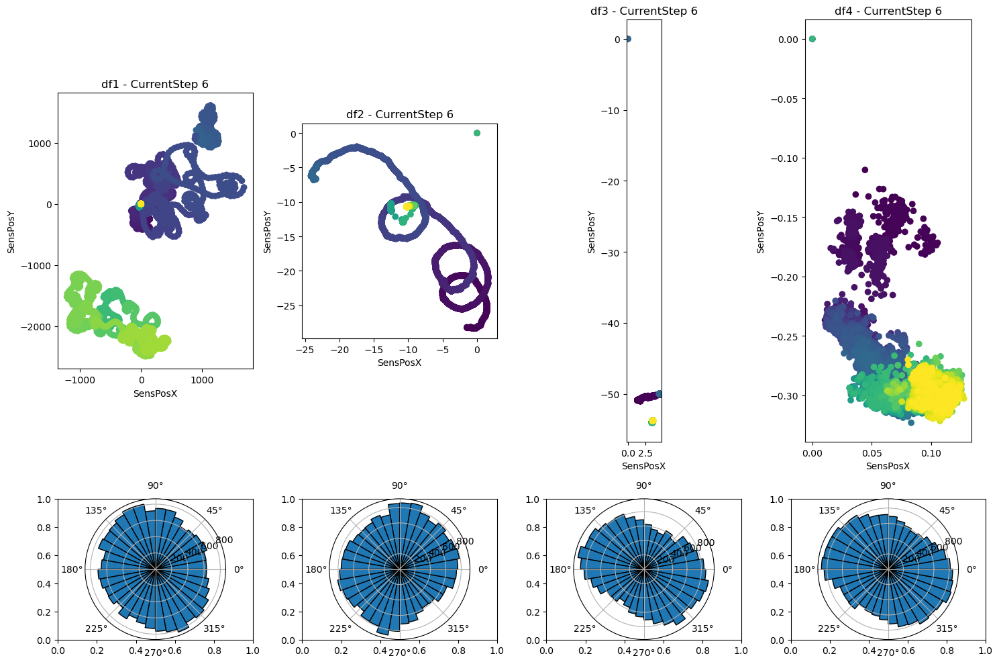

Step 7, Source df1, Direction Range: Min = -3.141144223126515, Max = 3.141592653589793
Step 7, Source df2, Direction Range: Min = -3.1408335169825565, Max = 3.141592653589793
Step 7, Source df3, Direction Range: Min = -3.140791179048248, Max = 3.141592653589793
Step 7, Source df4, Direction Range: Min = -3.1415703142847944, Max = 3.1414518630518833


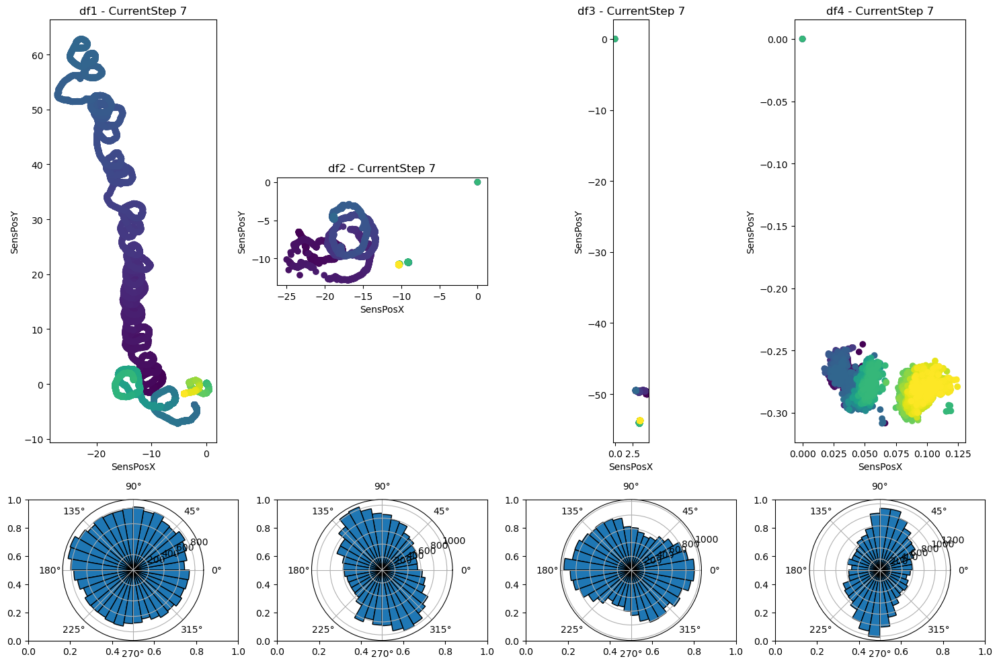

Step 0, Source df1, Direction Range: Min = -2.3631743675334755, Max = -2.3631743675334755
Step 0, Source df3, Direction Range: Min = -2.343925167238705, Max = -2.343925167238705
Step 0, Source df4, Direction Range: Min = -2.7951757010308, Max = -2.7951757010308


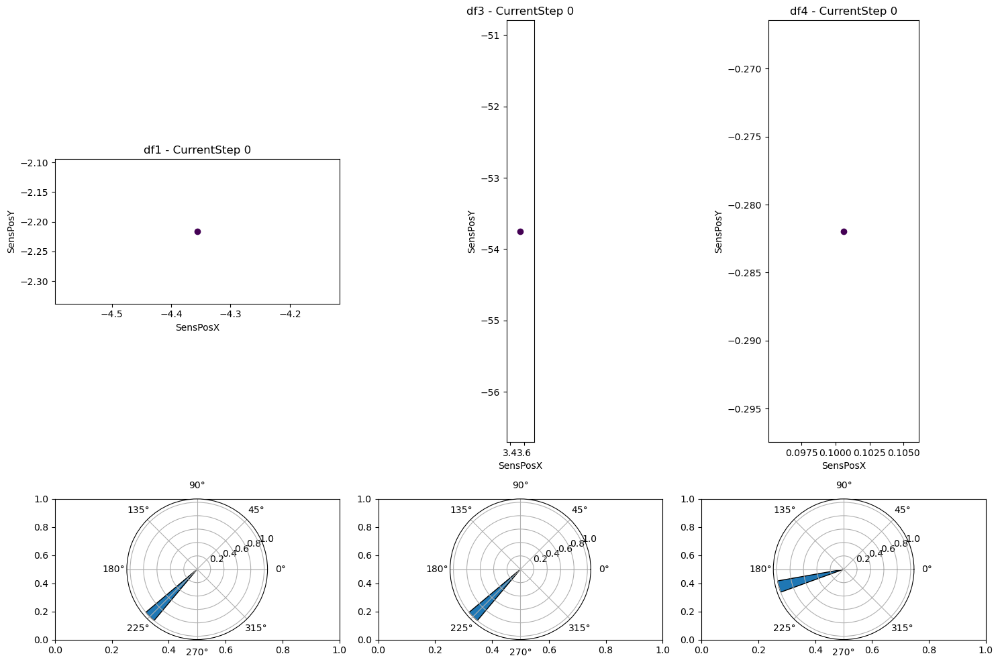

In [52]:
plot_trajectories_and_polar_histograms_2(df1[df1['movement_direction']!= 0], df2[df2['movement_direction']!= 0], df3[df3['movement_direction']!= 0], df4[df4['movement_direction']!= 0])


In [53]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_trajectories_and_polar_histograms_3(df1, df2, df3, df4):
    df1['source'] = 'df1'
    df2['source'] = 'df2'
    df3['source'] = 'df3'
    df4['source'] = 'df4'

    # Combine all DataFrames into one
    df_combined = pd.concat([df1, df2, df3, df4])

    # Get the unique steps
    steps = df_combined['CurrentStep'].unique()

    # Number of bins for the polar histogram
    num_bins = 36

    for step in steps:
        # Filter the DataFrame for the given step value
        filtered_df = df_combined[df_combined['CurrentStep'] == step]
        sources = filtered_df['source'].unique()

        # Creating a figure for trajectories and polar histograms
        fig, axes = plt.subplots(3, len(sources), figsize=(15, 15), 
                                 gridspec_kw={'height_ratios': [3, 1, 1]})

        # Adjust the axes array for single source
        if len(sources) == 1:
            axes = [axes]

        for i, source in enumerate(sources):
            # Filter by source
            source_df = filtered_df[filtered_df['source'] == source]

            # Plot trajectory
            ax_traj = axes[0][i] if len(sources) > 1 else axes[0]
            sc = ax_traj.scatter(source_df['SensPosY'], source_df['SensPosX'], c=np.arange(len(source_df)), cmap='viridis')
            ax_traj.set_title(f'{source} - CurrentStep {step}')
            ax_traj.set_xlabel('SensPosY')
            ax_traj.set_ylabel('SensPosX')
            ax_traj.set_aspect('equal', adjustable='box')  # Equal scaling for x and y axes

            # Plot first polar histogram
            ax_polar1 = fig.add_subplot(3, len(sources), len(sources) + i + 1, polar=True)
            direction_values = source_df['movement_direction'] /180 * np.pi
            counts, bin_edges = np.histogram(direction_values, bins=num_bins, range=(-np.pi, np.pi))
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            ax_polar1.bar(bin_centers, counts, width=bin_edges[1] - bin_edges[0], edgecolor='k')
            ax_polar1.set_theta_zero_location('N')
            ax_polar1.set_theta_direction(-1)

            # Plot second polar histogram for rot_x_values
            ax_polar2 = fig.add_subplot(3, len(sources), 2*len(sources) + i + 1, polar=True)
            rot_x_values = source_df[source_df['GameObjectRotY']!= 0]['GameObjectRotY']/180 * np.pi
            counts, bin_edges = np.histogram(rot_x_values, bins=num_bins, range=(0, 2*np.pi))
            bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
            ax_polar2.bar(bin_centers, counts, width=bin_edges[1] - bin_edges[0], edgecolor='k')
            ax_polar2.set_theta_zero_location('N')
            #ax_polar2.set_theta_direction(-1)

        plt.tight_layout()
        plt.show()


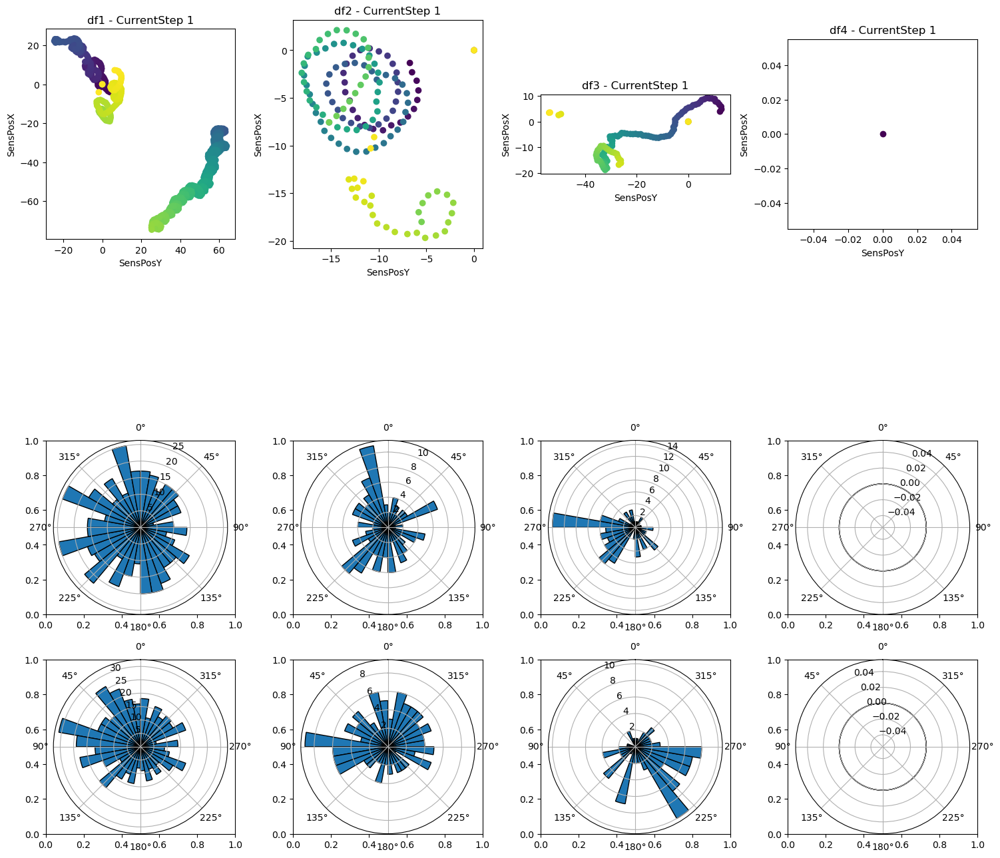

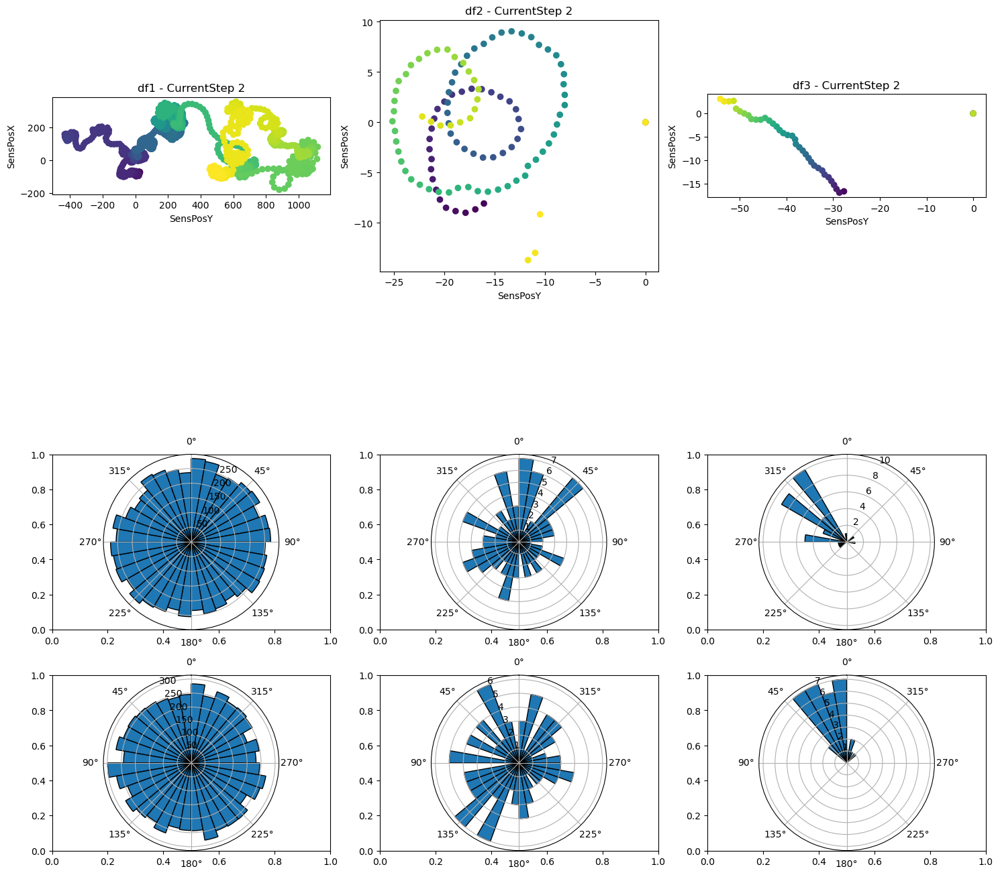

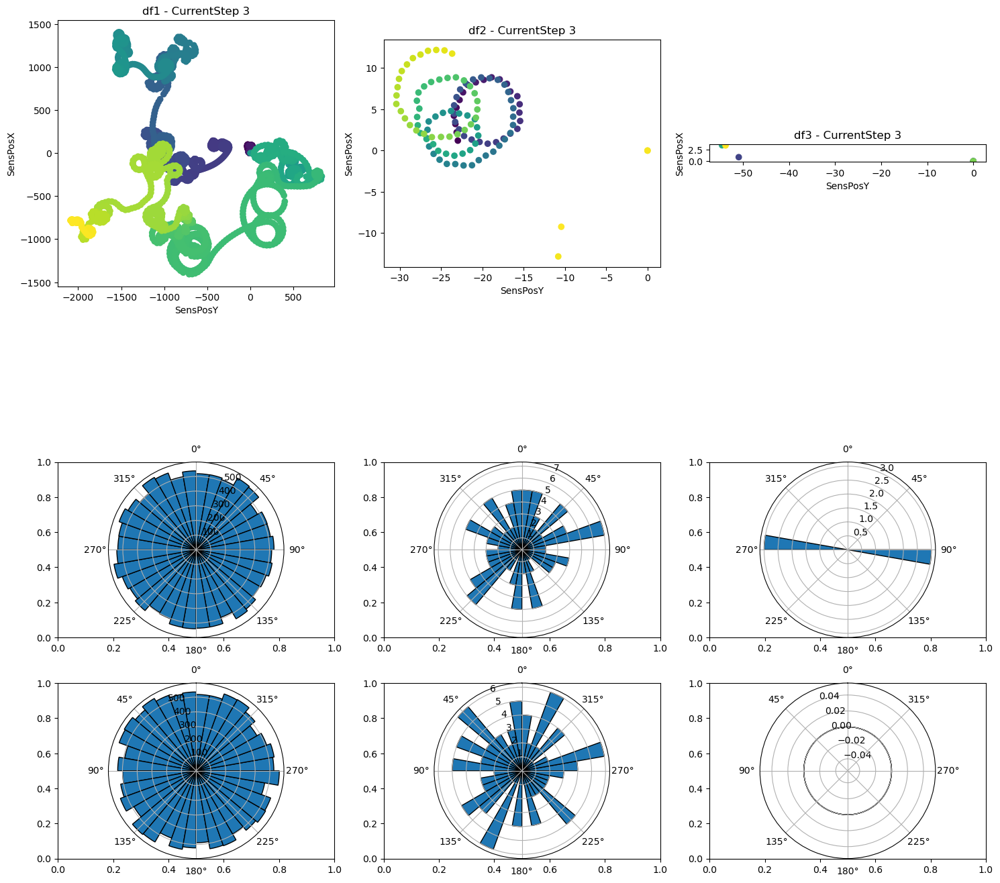

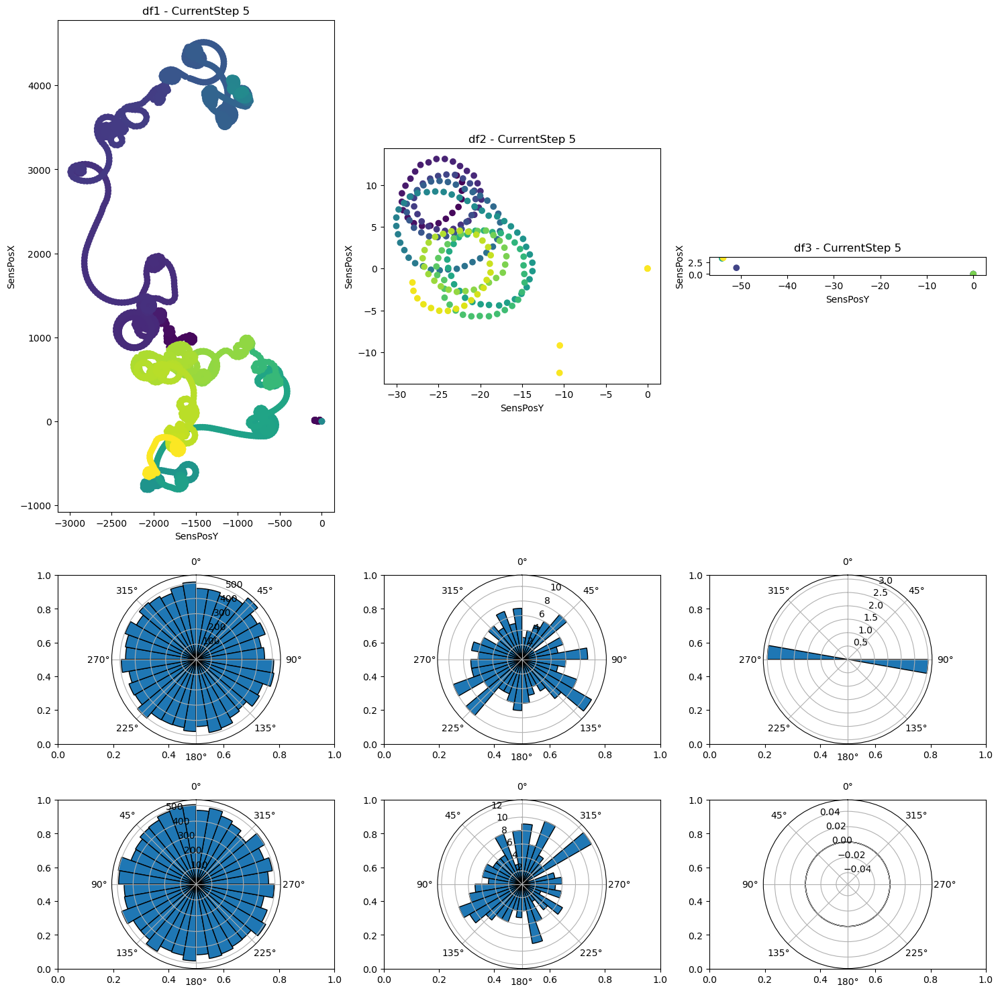

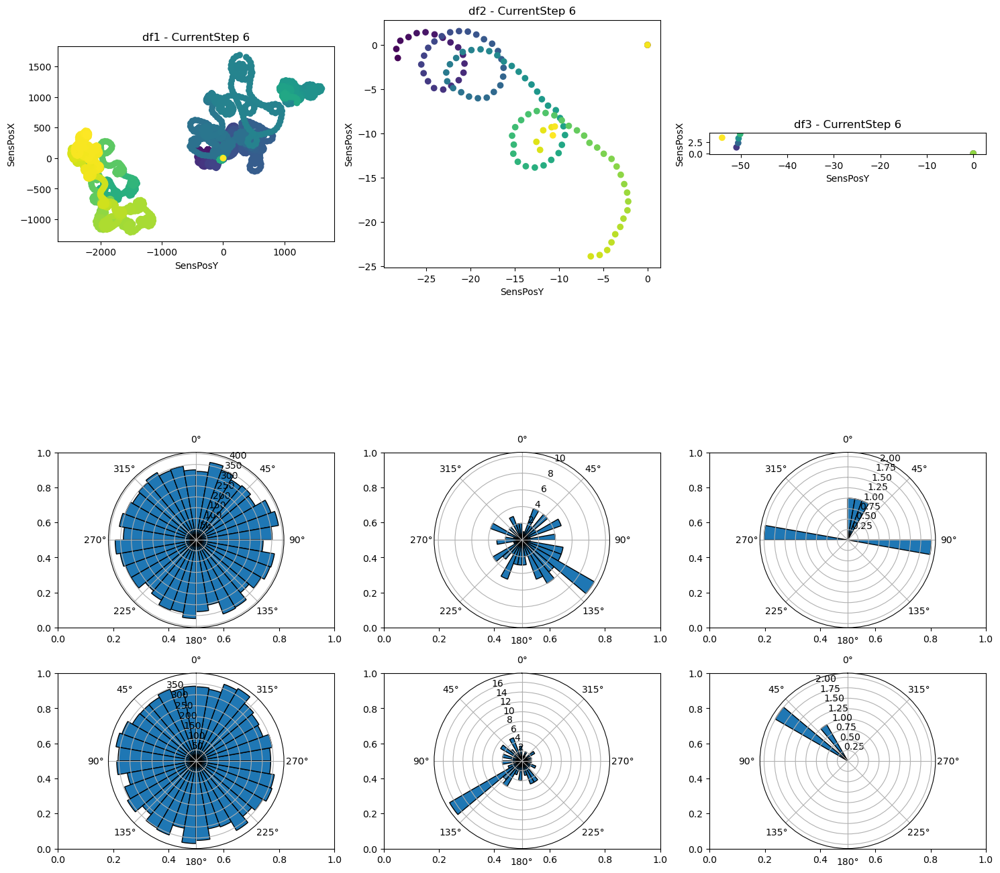

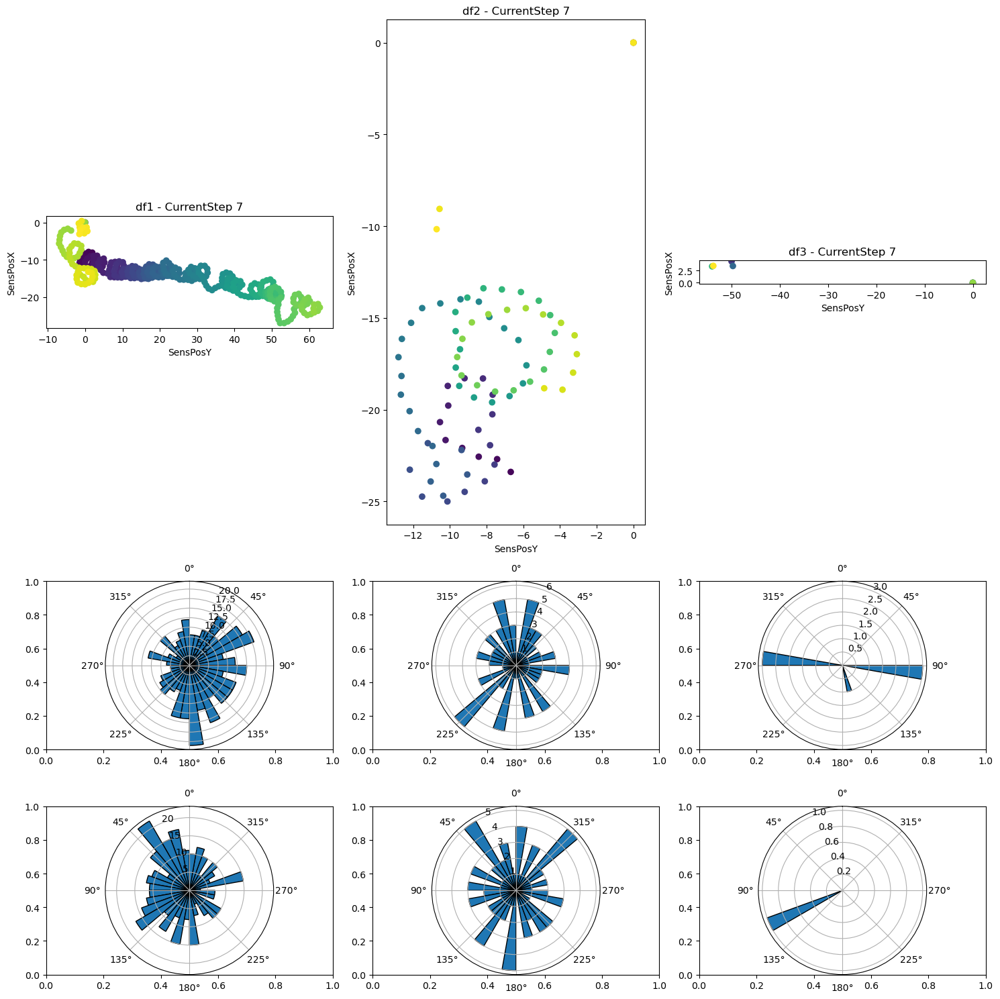

In [54]:
plot_trajectories_and_polar_histograms_3(df1_discretized, df2_discretized, df3_discretized, df4_discretized)